# Convolutions

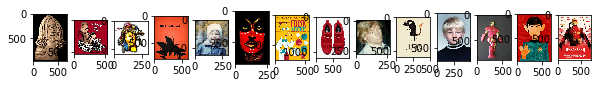

In [94]:
# Bring in python image analysis libraries
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage import color
import skimage.filters as filters
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage import feature
from skimage import morphology
from skimage.draw import circle_perimeter
from skimage import img_as_float, img_as_ubyte
from skimage import segmentation as seg
from skimage.morphology import watershed
from scipy import ndimage as nd
from scipy.ndimage import convolve
from skimage import feature
import glob # for bulk file import

# Set defaults
plt.rcParams['image.cmap'] = 'gray' # Display grayscale images in... grayscale.
plt.rcParams['image.interpolation'] = 'none' # Use nearest-neighbour
plt.rcParams['figure.figsize'] = 10, 10

# Import test images
imgpaths = glob.glob("./images/*.jpg") + glob.glob("./images/*.png")
# imgpaths = glob.glob("img/*.jpg") + glob.glob("img/*.png")  Windows
# Windows has different relative paths than Mac/Unix
imgset = [mpimg.imread(x) for x in imgpaths]

# Display thumbnails of the images to make sure they loaded
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

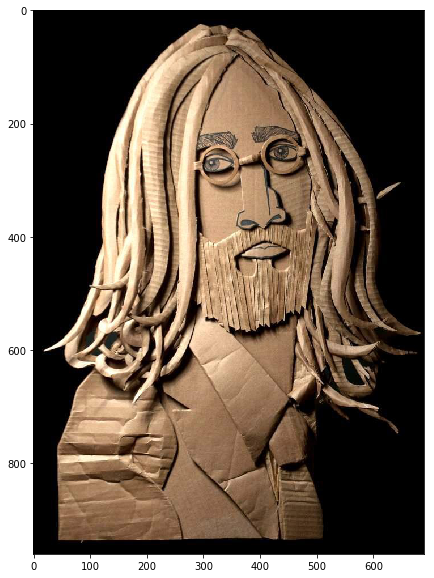

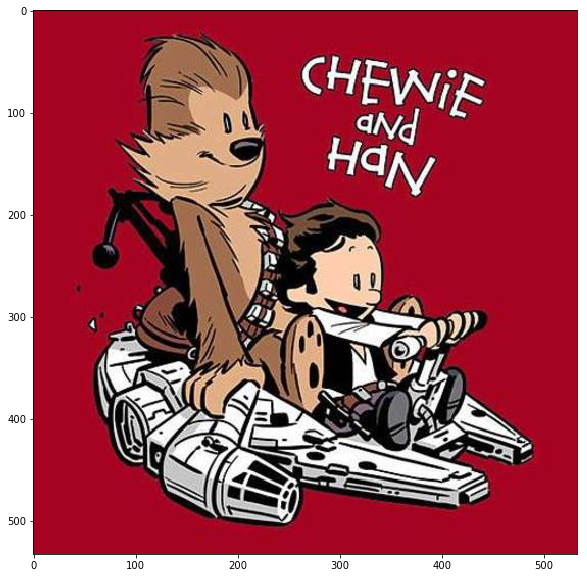

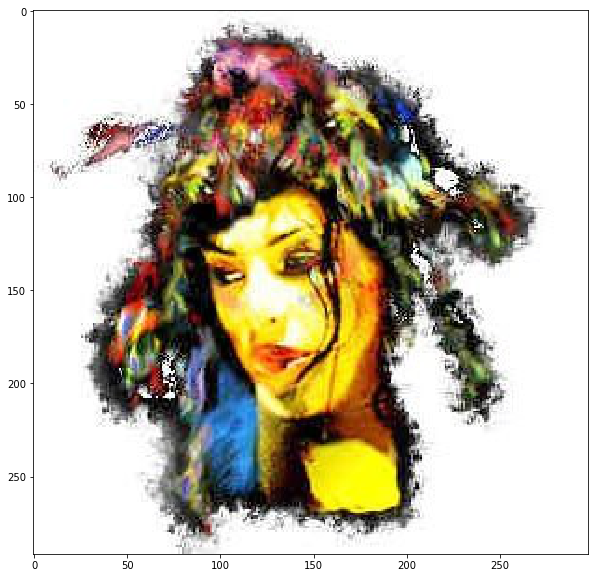

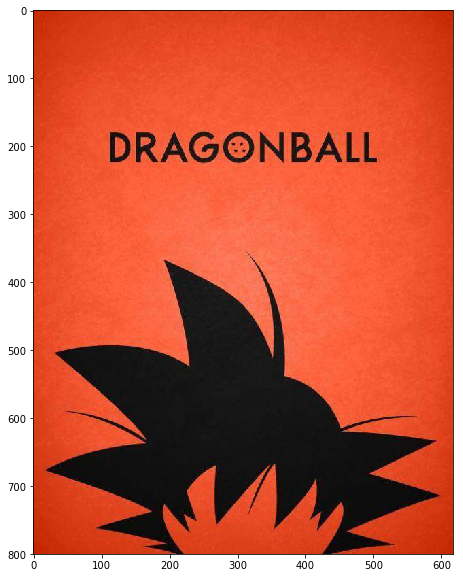

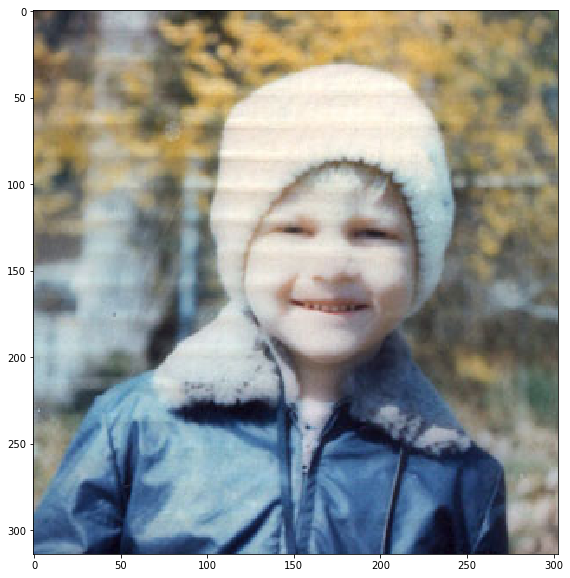

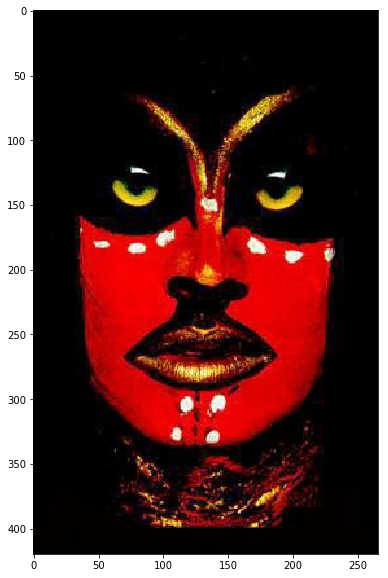

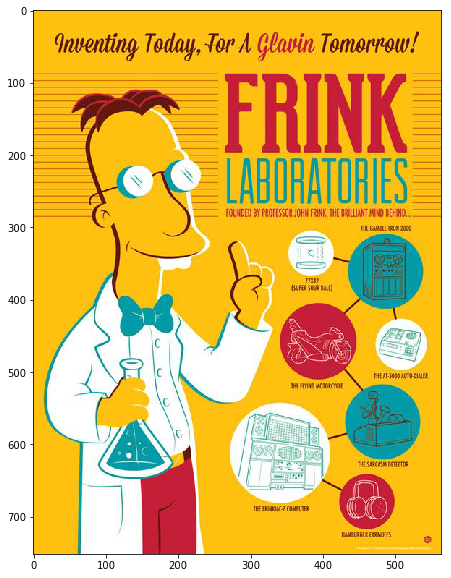

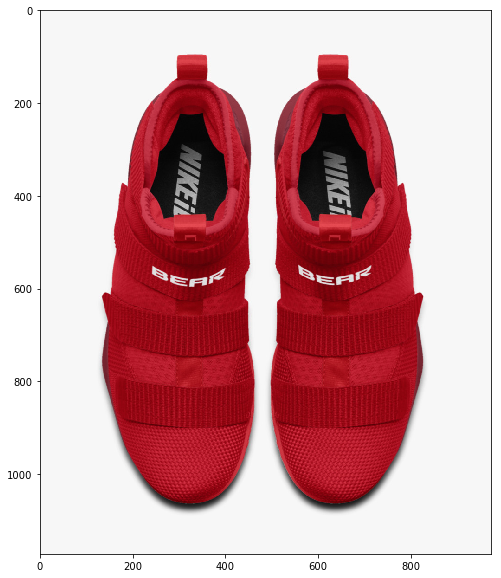

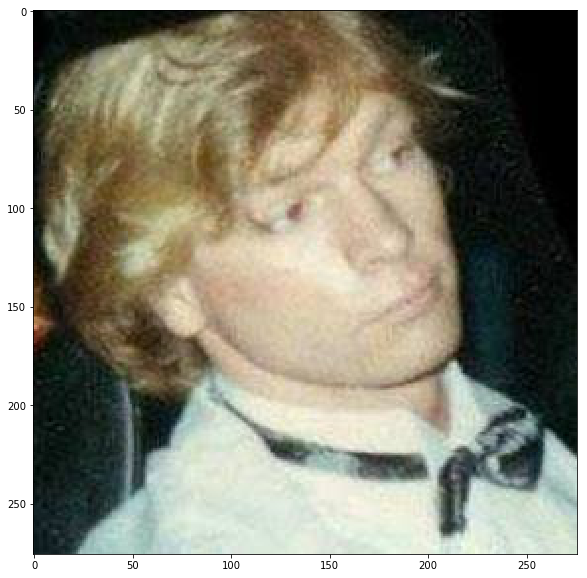

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


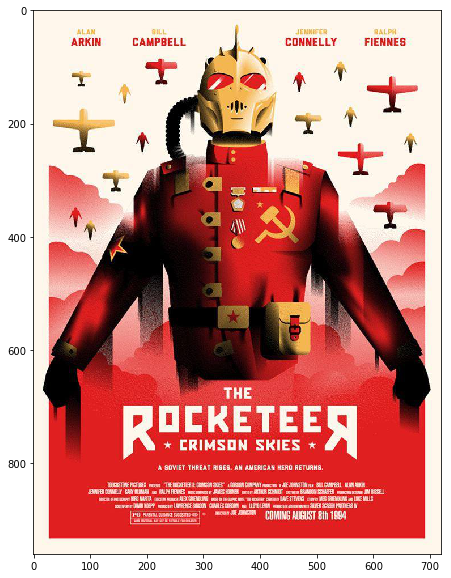

In [95]:
for i,img in enumerate(imgset):
    plt.figure()
    plt.imshow(img)

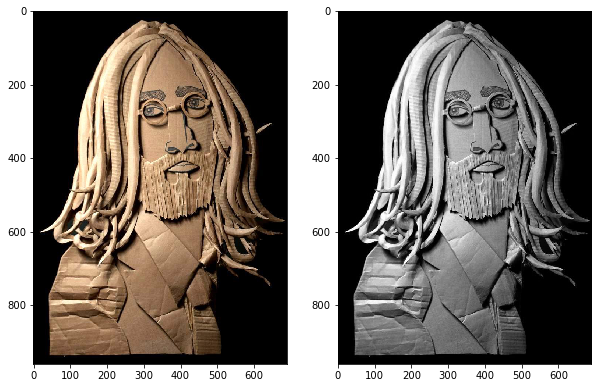

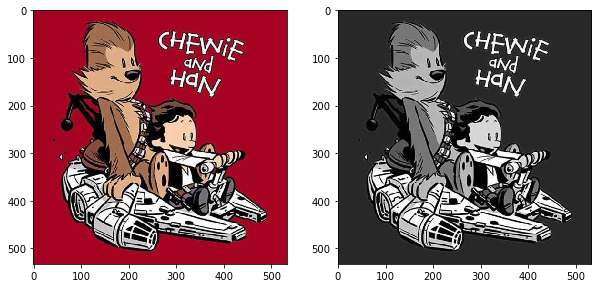

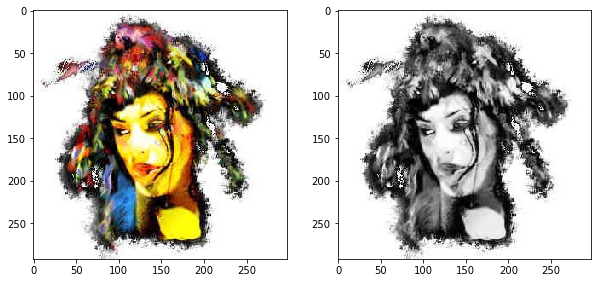

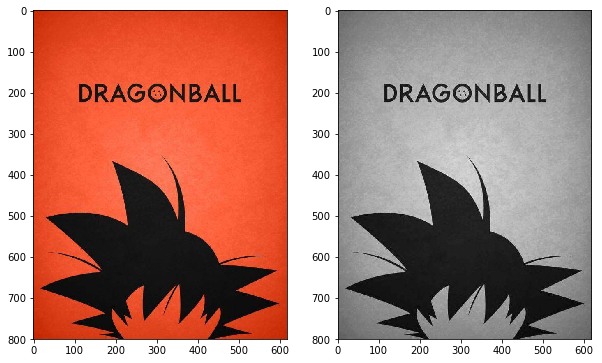

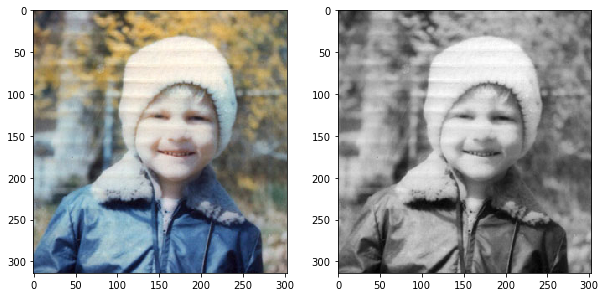

...

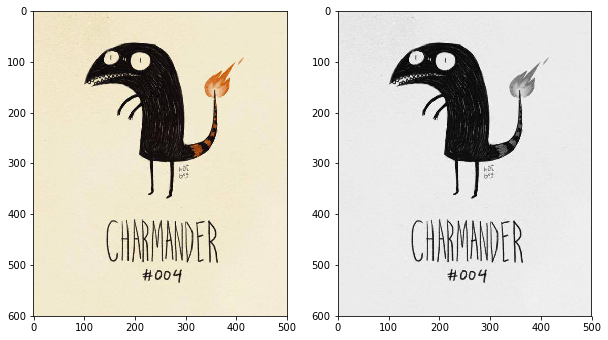

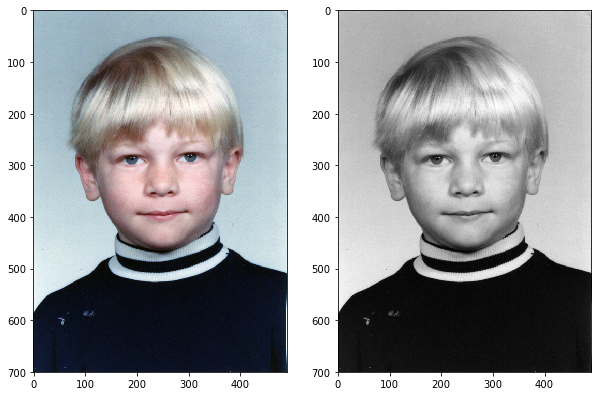

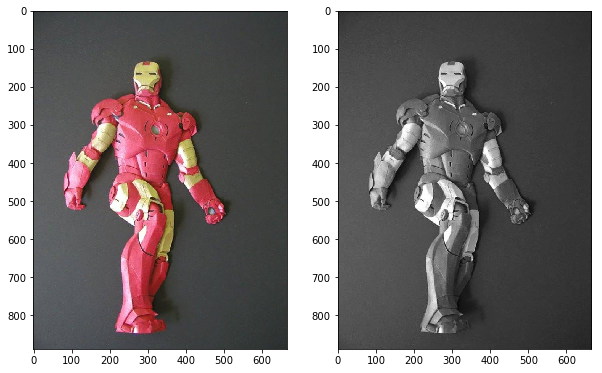

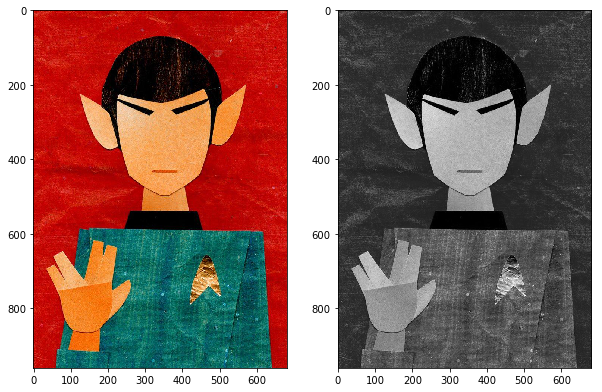

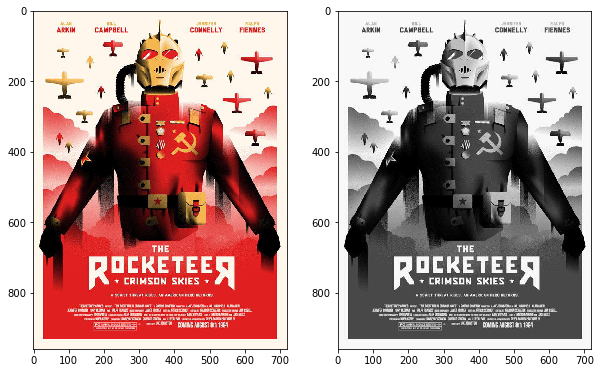

In [96]:
for i,img in enumerate(imgset):
    img_bw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1) # One row, two columns, image 1
    plt.imshow(img)
    plt.subplot(1, 2, 2)  # One row, two columns, image 2
    plt.imshow(img_bw)

## Sobel operator

The Sobel operator (https://en.wikipedia.org/wiki/Sobel_operator) uses two 3×3 kernels which are convolved with the original image to calculate approximations of the derivatives – one for horizontal changes, and one for vertical. If we define A as the source image, and Gx and Gy are two images which at each point contain the horizontal and vertical derivative approximations respectively, the computations are as follows


```python  
Gx = np.array([[-1, 0, +1],[-2, 0, +2],[-1, 0, +1]])
Gy = -Gx.transpose()
```  

Since the Sobel kernels can be decomposed as the products of an averaging and a differentiation kernel, they compute the gradient with smoothing.


The **Sobel operator**, sometimes called the **Sobel--Feldman operator**
or **Sobel filter**, is used in image processing and computer
vision, particularly within edge detection algorithms where it
creates an image emphasising edges. It is named after Irwin Sobel and
Gary Feldman, colleagues at the Stanford Artificial Intelligence
Laboratory (SAIL). Technically, it is a discrete differentiation operator, computing
an approximation of the gradient of the image intensity function. At
each point in the image, the result of the Sobel--Feldman operator is
either the corresponding gradient vector or the norm of this vector.
The Sobel--Feldman operator is based on convolving the image with a
small, separable, and integer-valued filter in the horizontal and
vertical directions and is therefore relatively inexpensive in terms of
computations. On the other hand, the gradient approximation that it
produces is relatively crude, in particular for high-frequency
variations in the image.

### Formulation


The operator uses two 3×3 kernels which are convolved with the
original image to calculate approximations of the derivatives -- one
for horizontal changes, and one for vertical. If we define **A** as the
source image, and **G**~*x*~ and **G**~*y*~ are two images which at each
point contain the horizontal and vertical derivative approximations
respectively, the computations are as follows:  

$$\mathbf{G}_x = \begin{bmatrix} 
 +1 & 0 & -1  \\
+2 & 0 & -2 \\
+1 & 0 & -1 
\end{bmatrix} * \mathbf{A}
\quad
\mbox{and}
\quad   
\mathbf{G}_y = \begin{bmatrix} 
 +1 & +2 & +1\\
 0 & 0 & 0 \\
-1 & -2 & -1
\end{bmatrix} * \mathbf{A}$$

where $*$ here denotes the 2-dimensional signal processing
convolution operation.

Since the Sobel kernels can be decomposed as the products of an
averaging and a differentiation kernel, they compute the gradient with
smoothing. For example, $\mathbf{G_x}$ can be written as

$$\begin{bmatrix} 
+1 & 0 & -1 \\
+2 & 0 & -2 \\
+1 & 0 & -1
\end{bmatrix}
=
\begin{bmatrix}
1\\
2\\
1
\end{bmatrix}
\begin{bmatrix}
+1 & 0 & -1
\end{bmatrix}$$

The *x*-coordinate is defined here as increasing in the
"right"-direction, and the *y*-coordinate is defined as increasing in
the "down"-direction. At each point in the image, the resulting
gradient approximations can be combined to give the gradient magnitude,
using:

$$\mathbf{G} = \sqrt{ {\mathbf{G}_x}^2 + {\mathbf{G}_y}^2 }$$

Using this information, we can also calculate the gradient\'s direction:

$$\mathbf{\Theta} = \operatorname{atan}\left({ \mathbf{G}_y \over \mathbf{G}_x }\right)$$
where, for example, **Θ** is 0 for a vertical edge which is lighter on
the right side.

In [113]:
# Apply a Sobel filter to the image.
def roll_your_own_sobel(img):
    sobel_kernel = np.array([[-1, 0, +1],[-2, 0, +2],[-1, 0, +1]])
    Gx = convolve(img, sobel_kernel)
    Gy = convolve(img, -sobel_kernel.transpose())
    return np.sqrt(np.square(Gx) + np.square(Gy))

# This should do the same thing as skimage.filters.sobel(img)

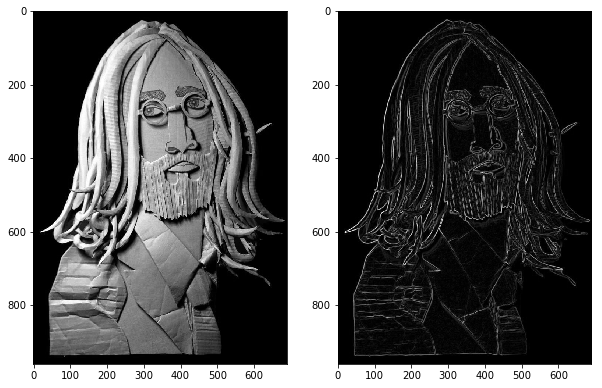

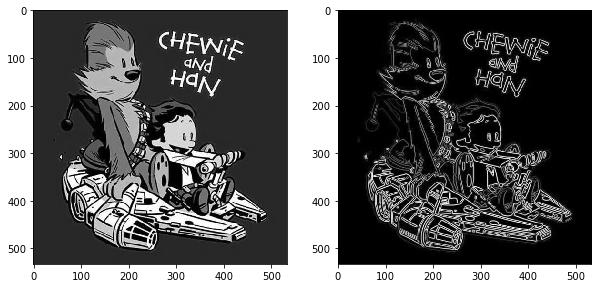

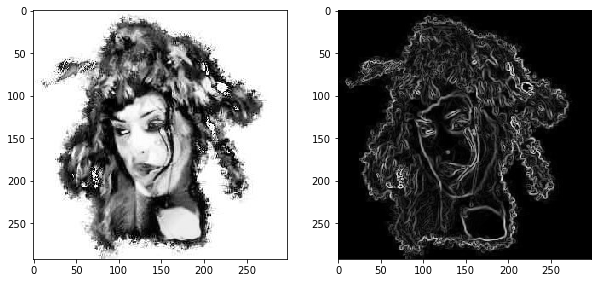

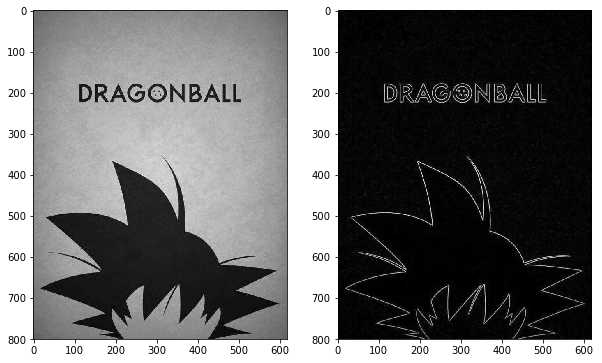

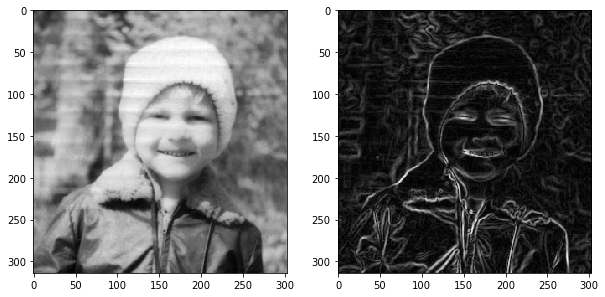

...

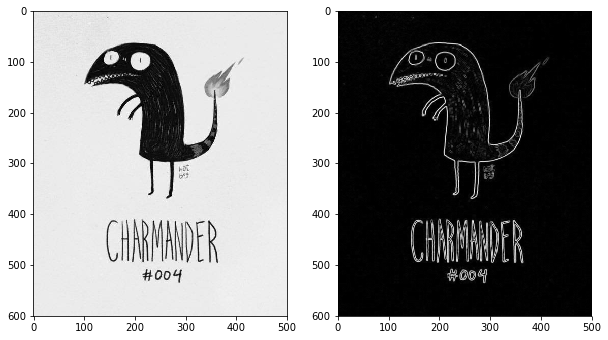

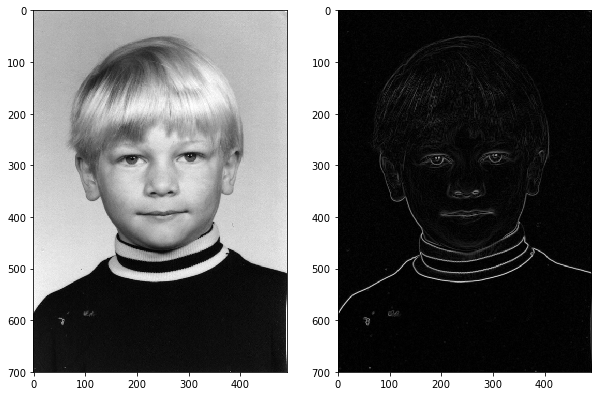

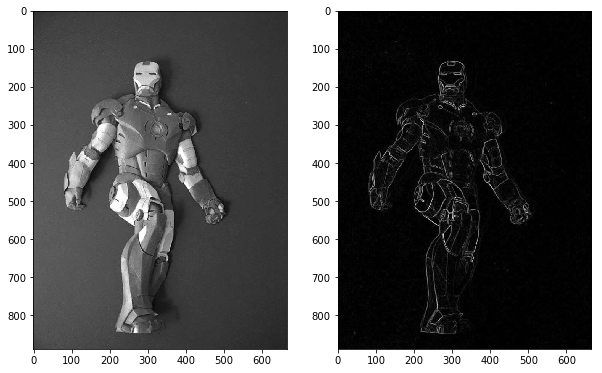

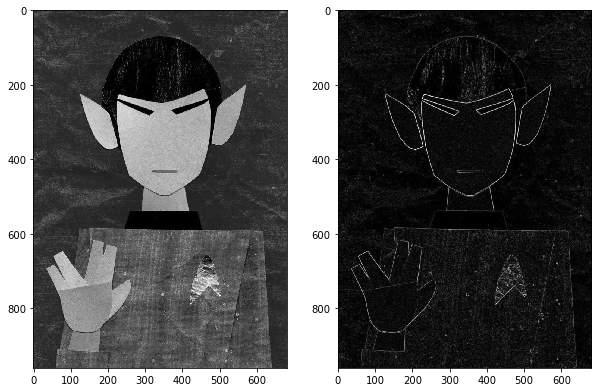

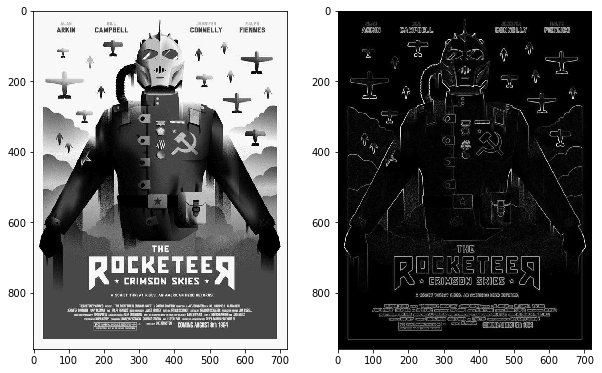

In [114]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(roll_your_own_sobel(imgbw))

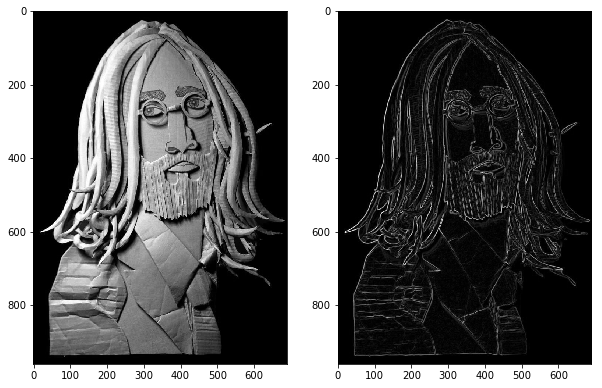

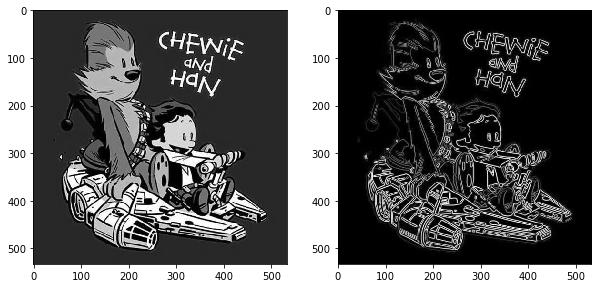

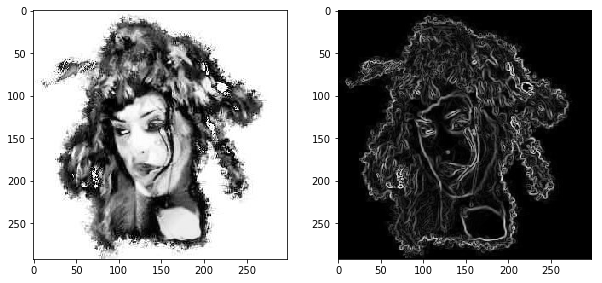

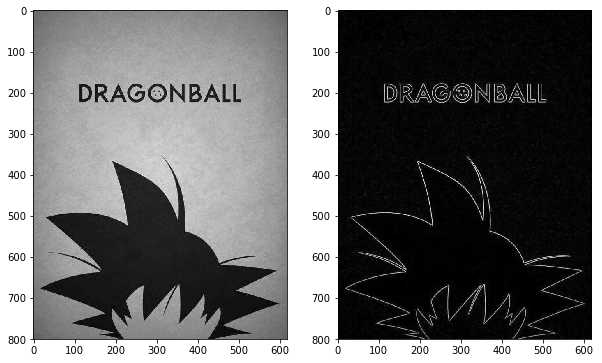

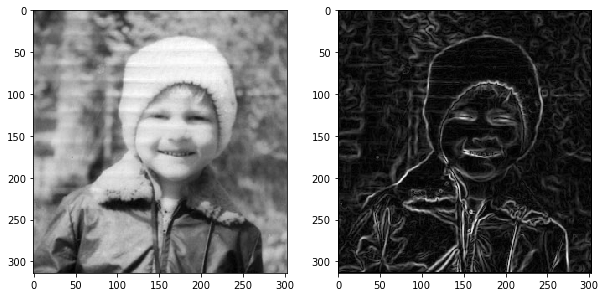

...

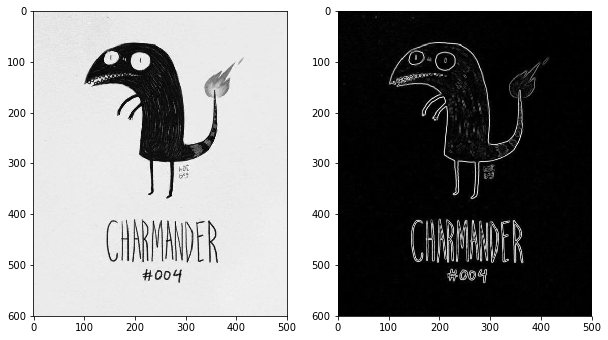

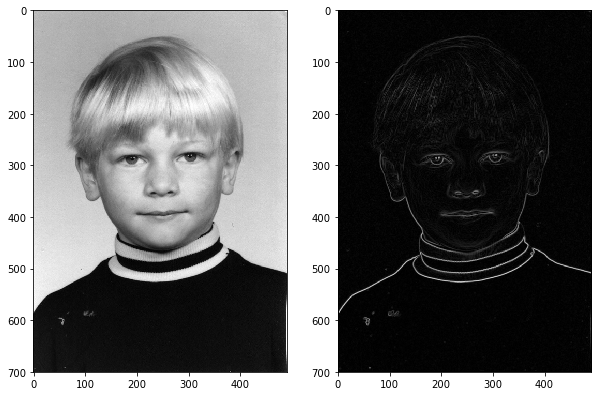

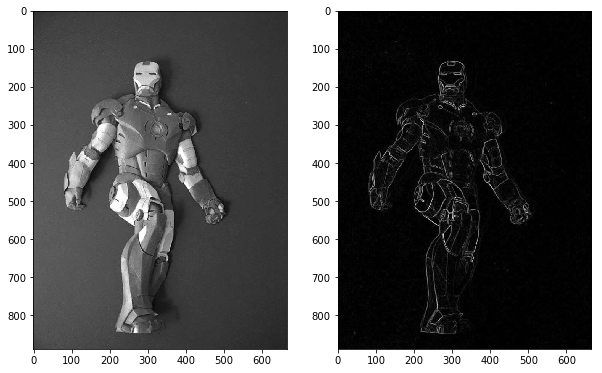

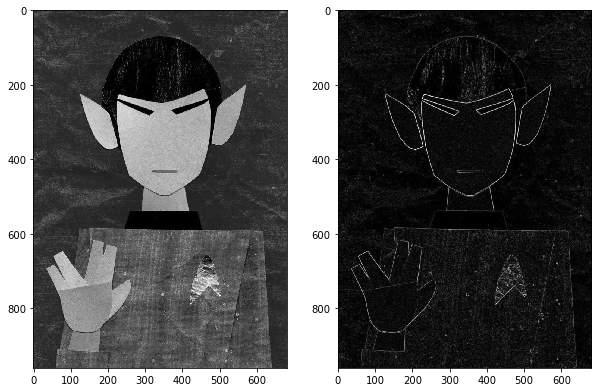

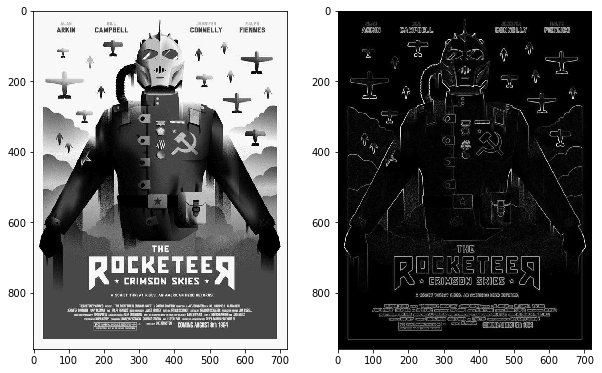

In [115]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(filters.sobel(imgbw))

Last update October 3, 2017

The text is released under the [CC-BY-NC-ND license](https://creativecommons.org/licenses/by-nc-nd/3.0/us/legalcode), and code is released under the [MIT license](https://opensource.org/licenses/MIT).